### Next step:
* include agent struct

In [1]:
1+1

2

In [1]:
using Flux
using Flux: crossentropy
using DifferentialEquations
using Plots
using LinearAlgebra
import Base.show

abstract type brainRegion end

mutable struct Actor <:brainRegion
  neuralNet
  goal
  learner
  expect
end

mutable struct Critic <:brainRegion
  neuralNet
  goal
  learner
  expect
  λ
end

mutable struct Model <:brainRegion
  neuralNet
  goal
  learner
  expect
end

mutable struct Memory
  values
  time
  weight
end

mutable struct Situation
    public
    private
    internal
    social
end

struct Traits
    identity
    parms
end

struct Agent
  brain::Dict{}
  memory::Memory
  situation::Situation
  traits::Traits
end

mutable struct Environment# <: AbstractEnvironment
    N::Int
    f::Function
    state::Array{Float64}
    prevState::Array{Float64}
    reward::Float64
    steps::Int
    pars
    tend::Int
end



┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/Flux/QdkVy.ji for Flux [587475ba-b771-5e3f-ad9e-33799f191a9c]
└ @ Base loading.jl:1190
┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/DifferentialEquations/UQdwS.ji for DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1190


In [2]:
#from Flux: 

#function crossentropy(ŷ::AbstractVecOrMat, y::AbstractVecOrMat; weight = 1)
#  -sum(y .* log.(ŷ) .* weight) / size(y, 2)
#end


function loss_π(π, v, action, rₜ)
    logπ = log.(mean(π .* action, 1) + 1f-10)
    advantage = rₜ - v
    -logπ .* advantage.data #to stop backpropagation through advantage
end
lossᵥ(v, rₜ) = cᵥ * (rₜ - v) .^ 2
entropy(π) = cₑ * mean(π .* log.(π + 1f-10), 1)
function loss(x)
  s = hcat(x[1, :]...) #|> gpu
  a = hcat(x[2, :]...) #|> gpu
  r = hcat(x[3, :]...) #|> gpu
  s′ = hcat(x[4, :]...) #|> gpu
  s_mask = .!hcat(x[5, :]...) #|> gpu
  
  base_out = base(s)
  v = value(base_out)
  π = softmax(policy(base_out))
  v′ = value(base(s′))
  rₜ = r + γ * v′ .* s_mask	# set v to 0 where s_ is terminal state
    # rₜA = r + γ * v′ - v
  mean(loss_π(π, v, a, rₜ) + lossᵥ(v, rₜ) + entropy(π))
end

loss (generic function with 1 method)

In [3]:
function Base.show(io::IO, a::Agent)
    k=fieldnames(a);
    for f in k
        println(io, typeof(getfield(a,f)))
    end
end

function baseNN(iN,oN)
    #Chain(Dense(iN, iN*2,relu),LSTM(iN*2, iN),Dense(iN, oN,relu))  Does not work...
    Chain(Dense(iN, iN,relu),Dense(iN, oN,relu))
end

function Actor(iN,oN) # params(neuralNet) can become NaN in some cases?? check in future
      #actor=Chain(Dense(iN, iN,relu),Dense(iN, oN,relu),softmax)
      actor=Chain(baseNN(iN,oN),softmax)
      loss(prevState, state,reward, action, social) = crossentropy(actor(prevState), action.*reward)#+0.1*sum(norm, params(actor))
      out=zeros(oN)
      Actor(actor,loss,ADAM(params(actor)),out)
  end
    function Critic(iN,oN)
      #critic=Chain(Dense(iN, iN,relu),Dense(iN, oN))
        adv=1.0
    cost=0.05
     discount=0.95
      critic=Chain(baseNN(iN,oN))
      loss(prevState, state,reward, action, social) = Flux.mse(critic(prevState), (reward-cost)+discount*critic(state).data[1]-adv*critic(prevState).data[1])#+0.1*sum(norm, params(critic))
      out=0.0
      Critic(critic,loss,ADAM(params(critic)),out, 0.99)
    end
    function Model(iN,oN)
      model=Chain(Dense(iN, 75,tanh),Dense(75, 50,tanh),Dense(50, 25,tanh),Dense(25, oN))
      loss(prevState, state,reward, action, social) = Flux.mse(model(prevState), state.-prevState)#+0.1*sum(norm, params(model))
      out=zeros(oN)
      Model(model,loss,ADAM(params(model)),out)
    end

Agent(;N=10)=Agent(
    Dict(:actor=>Actor(N,N+1),:critic=>Critic(N,1),:model=>Model(N,N)),
    Memory([],[],[]),
    Situation(rand(N),[],[],[]),
    Traits([],[])
    )

function Environment(I)
    function d(du,u,p,t)
        r,a,K,m=p
        du.=u.*(r.*(1 .-a*u./K)-m)
    end
    r=rand(I)*2                     # random growth vectors
    maxAlpha=0.5                    # max interaction effects
    a=rand(I,I)*maxAlpha.-maxAlpha/2 # interaction matrix
    [a[i,i]=1.0 for i=1:I]          # set self-competition = 1
    K=rand(I)                       # random Carrying capacity
    m=zeros(I).+0.05                 # equal mortality rates
    p=(r,a,K,m)
    return Environment(I,d,rand(I),zeros(I),0.0,0.0,p,100000)
end

function situation(a::Agent,e::Environment)
    return vcat(view(a.situation.public,:),view(a.situation.internal,:),view(a.situation.private,:),view(a.situation.social,:))
end

function expect!(bR::brainRegion,situation)
    bR.expect=collect(bR.neuralNet(situation))
end

function expect!(a::Agent,e::Environment)
    s=situation(a,e)
    for bR in keys(a.brain)
        expect!(a.brain[bR],s)
    end
end

function selectAction!(a::Agent)
    return argmax(a.brain[:actor].expect)
end

function implementAction!(a,e::Environment)
    e.pars[4].=0.05
    if a<=length(e.pars[4])
        e.pars[4][a]=0.2
    end
end

function stepSystem!(a::Agent,env::Environment; dt=1.0)
    env.prevState=env.state
    env.state=solve(ODEProblem(env.f,env.state,(env.steps,env.steps+dt),env.pars),Tsit5()).u[end]
    env.steps+=dt
end

function observe!(a::Agent,e::Environment)
    a.situation.public=e.state
end

function remember!(a::Agent, e::Environment)
  #td=r+λ*nS-S
    
  # NOTE add cost of harvesting somehow into actors parms
    
  action=argmax(a.brain[:actor].expect)
  reward=action<length(a.brain[:actor].expect) ? e.state[argmax(a.brain[:actor].expect)]*0.1 : 0.0
  push!(a.memory.values , (e.prevState,e.state,reward,oneHot(argmax(a.brain[:actor].expect),length(a.brain[:actor].expect)),a.situation.social))
  push!(a.memory.time , e.steps)
  push!(a.memory.weight , 1.0)
end

function selectMemories(a::Agent)
    rand(1:length(a.memory.values),min(length(a.memory.values),30))
end

function learn!(a::Agent)
    if length(a.memory.values)>5
        id=selectMemories(a)
        for bR in keys(a.brain)
            Flux.train!(a.brain[bR].goal, view(a.memory.values,id), a.brain[bR].learner)
        end
    end
end

function oneHot(i::Int,N::Int)
  out=zeros(N)
  out[i]=1
  out
end

function oneHot(i::Int,N::Int,v::Float64)
  oneHot(i,N).*v
end

oneHot (generic function with 2 methods)

In [4]:
baseNN(10,10)

Chain(Dense(10, 10, NNlib.relu), Dense(10, 10, NNlib.relu))

In [5]:
using JuMP, NLopt

function getOpt(r,a,c)
m = Model(solver = NLoptSolver(algorithm=:LD_SLSQP))
@variable(m, x[1:N] >= 0, start = 1.0 )
@variable(m, 1.0 >= h[1:N] >= 0, start = 0.01 )
for i in 1:N
    @NLconstraint(m, x[i] * (r[i] * (1 - sum(a[i,j] * x[j] for j in 1:N)) - h[i]) == 0)
end 
@NLconstraint(m,sum(h[i] for i in 1:N)==1)
@NLobjective(m, Max, sum(x[i]*h[i]-c*h[i] for i in 1:N))
solve(m)
    return getvalue(x),getvalue(h)#,getvalue(x).*(r.*(1-a*getvalue(x)./1)-getvalue(h))
end

x,h=getOpt(r,a,c)

┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/JuMP/DmXqY.ji for JuMP [4076af6c-e467-56ae-b986-b466b2749572]
└ @ Base loading.jl:1190
┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/NLopt/faRdv.ji for NLopt [76087f3c-5699-56af-9a33-bf431cd00edd]
└ @ Base loading.jl:1190


UndefVarError: UndefVarError: r not defined

In [6]:
# with new JuMP it should be:

Model(with_optimizer(NLopt.Optimizer, algorithm=:LD_SLSQP))

UndefVarError: UndefVarError: Optimizer not defined

In [7]:
function run(;N=10, M=500)
I=N
O=N
E=Environment(I)
a=Agent(N=I)
ET=zeros(M,E.N)
ac=zeros(Int64,M)
n=rand(1:I)
    observe!(a,E)
for i=1:M
  expect!(a,E)
  ac[i]=Int64(selectAction!(a))
  if rand()<0.0#exp(-i*0.05)
    ac[i]=rand(1:N+1)
    a.brain[:actor].expect.*=0.0
    a.brain[:actor].expect[ac[i]]=1.0
  else
    ac[i]=sum(rand().>cumsum(a.brain[:actor].expect))+1
    a.brain[:actor].expect.*=0.0
    a.brain[:actor].expect[ac[i]]=1.0
  end
  implementAction!(ac[i],E)
  stepSystem!(a,E)
  observe!(a,E)
  remember!(a,E)
  learn!(a)
  
  ET[i,:]=E.state
  if i==div(M,2)
    E=Environment(I)
end
  #E.pars[4][n].=*(rand()/10-0.05)*2.0
end
acE=[ac[i]<length(a.brain[:actor].expect) ? ET[i,ac[i]] : NaN for i in 1:M]
p1=plot(ET,legend=true); scatter!(p1,acE, c=:black,m=3, markerstrokewidth=0, markeralpha=0.2, label="")
p2=scatter(1:M,ac, m=3, markerstrokewidth=0, markeralpha=0.2)
return a,E,ac,plot(p1,p2,layout=(2,1), size=(700,600))
end

run (generic function with 1 method)

In [8]:
episode([actor(parms) for i in x], environment)

UndefVarError: UndefVarError: x not defined

In [9]:
a,e,ac,p=run(N=10, M=20000)

plot(p)

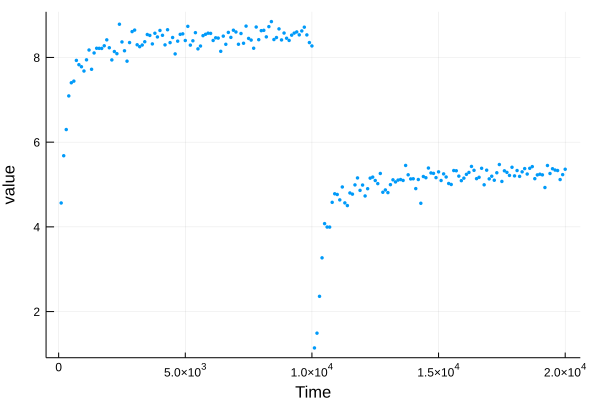

In [10]:
n=100
r=[a.memory.values[i][3] for i in 1:length(a.memory.values)]
R=[sum(r[(i-1)*n+1:(i)*n]) for i in 1:div(length(r),n)]

#scatter([a.memory.values[i][3] for i in 1:length(a.memory.values)], m=2)
scatter((1:length(R)).*n,R, m=2,markerstrokewidth=0, legend=false, xlabel="Time", ylabel="value")

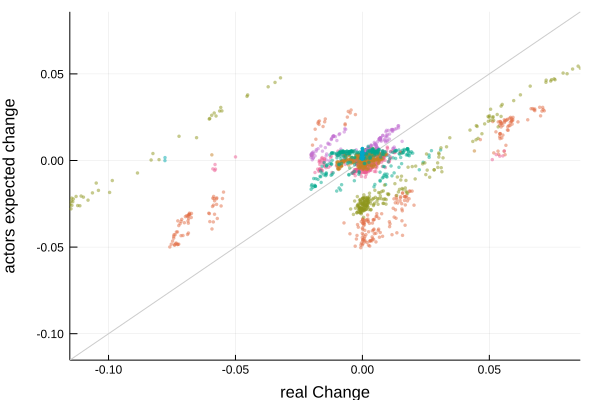

In [11]:
n=100:350
TF=[a.memory.values[i][2]-a.memory.values[i][1] for i in n]
TA=[a.brain[:model].neuralNet(a.memory.values[i][1]).data for i in n];
TAM=zeros(length(TA),length(TA[1]))
[TAM[i,:]=TA[i] for i in eachindex(TA)]
TFM=zeros(length(TF),length(TF[1]))
[TFM[i,:]=TF[i] for i in eachindex(TF)]
mi,ma=extrema(vcat(TFM[:],TAM[:]))
plot([mi,ma],[mi,ma],c=RGB(0.8,0.8,0.8))
scatter!(TFM,TAM,m=2, markerstrokewidth=0, markeralpha=0.5, xlim=(mi,ma),ylim=(mi,ma), legend=false, xlabel="real Change", ylabel="actors expected change")


### Homo Discimus: a(nother) model of human behaviour

we learn


the ultimate learning quest is to learn why we learn. What is it that shapes the learning algorithms in our brians. What is the attractor of the reperesentation of the world we build in our brains. Is it to procreate, to survive, to do good, to be admired, to belong?

While I find it hard to argue against the fact that learning is central and behavioural patterns is an emergent property thereof, i.e. the solution to an iterative optimization problem, it still eludes us to understand what this attractor(s) of the brain is

In [12]:
state=rand(10)
action=[]
social=[]
reward=1.0
prevState=rand(10)
println(expect!(c,prevState))
c.goal(prevState, state,reward, action, social)
m.goal(prevState, state,reward, action, social)

UndefVarError: UndefVarError: c not defined

In [13]:
Flux.train!(c.goal, [(prevState, state,reward, action, social)], c.learner)
Flux.train!(m.goal, [(prevState, state,reward, action, social)], m.learner)

UndefVarError: UndefVarError: c not defined

In [14]:
c.goal(prevState, state,reward, action, social)

UndefVarError: UndefVarError: c not defined

In [15]:
m.goal(prevState, state,reward, action, social)

UndefVarError: UndefVarError: m not defined

In [16]:
view(a.situation.internal,:)

0-element view(::Array{Any,1}, :) with eltype Any

In [17]:
using Clp

m = Model(solver = ClpSolver())
@variable(m, 0 <= x <= 2 )
@variable(m, 0 <= y <= 30 )

@objective(m, Max, 5x + 3*y )
@constraint(m, 1x + 5y <= 3.0 )

print(m)

status = JuMP.solve(m)

println("Objective value: ", getobjectivevalue(m))
println("x = ", getvalue(x))
println("y = ", getvalue(y))

ArgumentError: ArgumentError: Package Clp not found in current path:
- Run `import Pkg; Pkg.add("Clp")` to install the Clp package.


In [18]:
function test(a::brainRegion)
    show(a.loss)
end

function test(a::Actor)
    show(a.net)
end

test (generic function with 2 methods)

In [19]:
Actor <: brainRegion

true

In [20]:
test(Critic(10,10))

ErrorException: type Critic has no field loss

In [21]:
b=brain(10)

UndefVarError: UndefVarError: brain not defined

In [22]:
using ECharts

┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/ECharts/AeYWT.ji for ECharts [f9630f5b-a116-5b0c-bd6c-4699aee17694]
└ @ Base loading.jl:1190


HTML{String}("    <script id=\"webio-setup-13936180373210480011\">\n    // Immediately-invoked-function-expression to avoid global variables.\n    (function() {\n        var warning_div = document.getElementById(\"webio-warning-9212028182639799775\");\n        var hide = function () {\n            var script = document.getElementById(\"webio-setup-13936180373210480011\");\n            var parent = script && script.parentElement;\n            var grandparent = parent && parent.parentElement;\n            if (grandparent) {\n                grandparent.style.display = \"none\";\n            }\n            warning_div.style.display = \"none\";\n        };\n        if (window.require && require.defined) {\n            // Jupyter notebook.\n            if (require.defined(\"nbextensions/webio/main\")\n                    || require.defined(\"/assetserver/fc3b3c5f68e980c0997acebd4027a6087ab12a62-dist/main.js\")) {\n                // Extension already loaded.\n                hide();\n                return;\n            }\n            console.warn(\"Loading WebIO Jupyter extension on an ad-hoc basis. Consider enabling the WebIO nbextension for a stabler experience (this should happen automatically when building WebIO).\");\n            require([\"/assetserver/fc3b3c5f68e980c0997acebd4027a6087ab12a62-dist/main.js\"], function (webIOModule) {\n                webIOModule.load_ipython_extension();\n            });\n            warning_div.innerHTML = \"<strong>Loading WebIO Jupyter extension on an ad-hoc basis. Consider enabling the WebIO nbextension for a stabler experience (this should happen automatically when building WebIO).</strong>\";\n        } else if (window.location.pathname.includes(\"/lab\")) {\n            // Guessing JupyterLab\n            warning_div.innerHTML = \"WebIO does not support JupyterLab yet.\";\n        }\n    })();\n    </script>\n    <div\n        id=\"webio-warning-9212028182639799775\"\n        class=\"output_text output_stderr\"\n        style=\"padding: 1em; font-weight: bold;\"\n    >\n        Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n        <!-- TODO: link to installation docs. -->\n    </div>\n")

loaded


In [23]:
#Define data
x = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
y = [11., 11., 15., 13., 12., 13., 10.]

#Step 1: Choose a base chart type
ar = area(x, y, color = lineargradient("purple", "cyan"))

#Step 2: Apply visualization mutating functions
smooth!(ar)
xaxis!(ar, name = "Day of Week")
yaxis!(ar, name = "Daily High Temperature °C")

UndefVarError: UndefVarError: xaxis! not defined

In [24]:
x = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
y = [11, 11, 15, 13, 12, 13, 10]
bch = bar(x, hcat(0.95 .* y, 1.25 .* y, y), color = "lightgray", horizontal = true, stack=true)

UndefVarError: UndefVarError: bar not defined

In [25]:
Random.seed!(13579)
xval = rand() .* (0:1000:30000)
yval = 60 .+ (rand(31) * 20)
sizeval = shuffle!(6000 .* (rand(31) * 50))

sp = bubble(xval, yval, sizeval, scale = true)

UndefVarError: UndefVarError: Random not defined

In [26]:
x = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
y = [11, 11, 15, 13, 12, 13, 10]
p = pie(x, y)

UndefVarError: UndefVarError: pie not defined

In [27]:
t = 0:360
angle = [a / 180 * pi for a in t]
radius = [(sin(2t) * cos(2t)) for t in angle]
radius2 = [(sin(2.5t) * cos(2.5t)) for t in angle]
p2 = polar(angle, hcat(radius, radius2))

EChart
  ec_width: Int64 800
  ec_height: Int64 400
  ec_renderer: String "canvas"
  ec_charttype: String "polar"
  theme: Theme
  title: Array{Title}((1,))
  legend: Legend
  grid: Array{Grid}((1,))
  xAxis: Nothing nothing
  yAxis: Nothing nothing
  polar: Array{ECharts.Polar}((1,))
  radiusAxis: ECharts.RadiusAxis
  angleAxis: ECharts.AngleAxis
  radar: Nothing nothing
  dataZoom: Nothing nothing
  visualMap: Nothing nothing
  tooltip: Tooltip
  axisPointer: Nothing nothing
  toolbox: Toolbox
  brush: Nothing nothing
  geo: Nothing nothing
  parallel: Nothing nothing
  parallelAxis: Nothing nothing
  singleAxis: Nothing nothing
  timeline: Nothing nothing
  graphic: Nothing nothing
  calendar: Nothing nothing
  dataset: Nothing nothing
  aria: ECharts.Aria
  series: Array{XYSeries}((2,))
  color: Nothing nothing
  backgroundColor: Nothing nothing
  textStyle: Nothing nothing
  animation: Nothing nothing
  animationThreshold: Nothing nothing
  animationDuration: Nothing nothing
  animationEasing: Nothing nothing
  animationDelay: Nothing nothing
  animationDurationUpdate: Nothing nothing
  animationEasingUpdate: Nothing nothing
  animationDelayUpdate: Nothing nothing
  progressive: Nothing nothing
  progressiveThreshold: Nothing nothing
  blendMode: Nothing nothing
  hoverLayerThreshold: Nothing nothing
  useUTC: Nothing nothing

In [28]:
using NoveltyColors, Colors

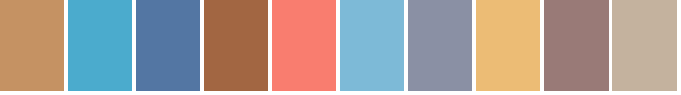

In [29]:
parse.(Colorant, ColorDict["michiyo"]["WindRise2"])

In [30]:
using WebIO, JSExpr

In [31]:
options=js"""
{title:{text:'ECharts entry example'},tooltip: {},legend: {data:['Sales']},xAxis: {data: ["shirt","cardign","chiffon shirt","pants","heels","socks"]},yAxis: {},series: [{name: 'Sales',type: 'bar',data: [5, 20, 36, 10, 10, 20]}]};
"""

JSString("{title:{text:'ECharts entry example'},tooltip: {},legend: {data:['Sales']},xAxis: {data: [\"shirt\",\"cardign\",\"chiffon shirt\",\"pants\",\"heels\",\"socks\"]},yAxis: {},series: [{name: 'Sales',type: 'bar',data: [5, 20, 36, 10, 10, 20]}]};\n")

In [32]:
@js {title:{text:"ECharts entry example"},tooltip: {},legend: {data:["Sales"]},xAxis: {data: ["shirt","cardign","chiffon shirt","pants","heels","socks"]},yAxis: {},series: [{name: "Sales",type: "bar",data: [5, 20, 36, 10, 10, 20]}]};


LoadError: JSExpr: Unsupported `braces` expression, {title:{text:"ECharts entry example"}, tooltip:{}, legend:{data:["Sales"]}, xAxis:{data:["shirt", "cardign", "chiffon shirt", "pants", "heels", "socks"]}, yAxis:{}, series:[{name:"Sales", type:"bar", data:[5, 20, 36, 10, 10, 20]}]}

In [33]:
w = Scope(imports=["//cdnjs.cloudflare.com/ajax/libs/p5.js/0.5.11/p5.js"])

onimport(w, @js function (p5)
    function sketch(s)
        s.setup = () -> s.createCanvas(640, 480)

        s.draw = function ()
          if s.mouseIsPressed
            s.fill(0)
          else
            s.fill(255)
          end
          s.ellipse(s.mouseX, s.mouseY, 80, 80)
        end
    end
    @new p5(sketch, this.dom.querySelector("#container"))
end)

w(dom"div#container"())

Scope("scope-65d320e7-094d-44ce-9566-dde0802ce7cd", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[], Dict{Symbol,Any}(:id=>"container"), 0), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}(), Set(String[]), nothing, ["//cdnjs.cloudflare.com/ajax/libs/p5.js/0.5.11/p5.js"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("(function (p5){function sketch(s){s.setup=(function (){return s.createCanvas(640,480)}); return s.draw=(function (){s.mouseIsPressed ? (s.fill(0)) : (s.fill(255)); return s.ellipse(s.mouseX,s.mouseY,80,80)})}; return new p5(sketch,this.dom.querySelector(\"#container\"))})")])), WebIO.ConnectionPool(Channel{Any}(sz_max:9223372036854775807,sz_curr:0), Set(AbstractConnection[]), Channel{AbstractConnection}(sz_max:32,sz_curr:0)))

In [34]:
node(:div, "Hello, World",
     style=Dict(:backgroundColor => "black",
                :color => "white",
                :padding => "12px"))

(div { style=Dict(:color=>"white",:padding=>"12px",:backgroundColor=>"black") }
  "Hello, World")

In [35]:
scope = Scope(imports=["https://raw.githubusercontent.com/ecomfe/echarts/4.1.0-release/dist/echarts.min.js"])

options=js"""
{title:{text:'ECharts entry example'},tooltip: {},legend: {data:['Sales']},xAxis: {data: ["shirt","cardign","chiffon shirt","pants","heels","socks"]},yAxis: {},series: [{name: 'Sales',type: 'bar',data: [5, 20, 36, 10, 10, 20]}]};
"""

onimport(scope, @js function (echarts)
        @var myChart = echarts.init(this.dom.querySelector("#myplot"))#, $theme, $renderer)
        myChart.setOption($options);
        window.onresize = () -> myChart.resize()
end)

scope(dom"div#myplot"())
WebIO.render(scope)

(Scope("scope-6a08ef3d-bdea-4c02-b34f-fe3453a71497", Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[], Dict{Symbol,Any}(:id=>"myplot"), 0), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}(), Set(String[]), nothing, ["https://raw.githubusercontent.com/ecomfe/echarts/4.1.0-release/dist/echarts.min.js"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("(function (echarts){var myChart=echarts.init(this.dom.querySelector(\"#myplot\")); myChart.setOption({title:{text:'ECharts entry example'},tooltip: {},legend: {data:['Sales']},xAxis: {data: [\"shirt\",\"cardign\",\"chiffon shirt\",\"pants\",\"heels\",\"socks\"]},yAxis: {},series: [{name: 'Sales',type: 'bar',data: [5, 20, 36, 10, 10, 20]}]};\n); return window.onresize=(function (){return myChart.resize()})})")])), WebIO.ConnectionPool(Channel{Any}(sz_max:9223372036854775807,sz_curr:0), Set(AbstractConnection[]), Channel{AbstractConnection}(sz_max:32,sz_curr:0))):
  (div { id="myplot" }))

┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/VegaLite/lrJqi.ji for VegaLite [112f6efa-9a02-5b7d-90c0-432ed331239a]
└ @ Base loading.jl:1190
┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/VegaDatasets/v6OW9.ji for VegaDatasets [0ae4a718-28b7-58ec-9efb-cded64d6d5b4]
└ @ Base loading.jl:1190


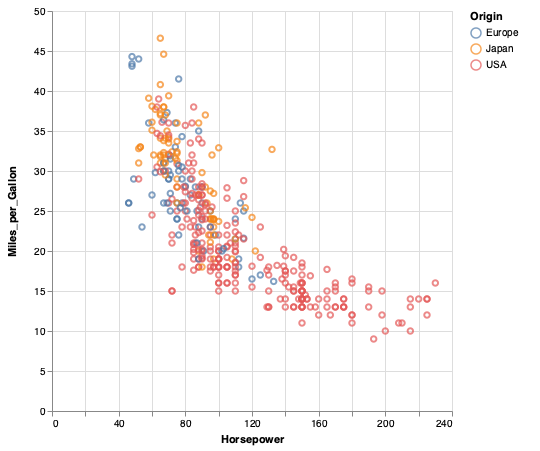

In [36]:
using VegaLite, VegaDatasets

dataset("cars") |>
@vlplot(
    :point,
    x=:Horsepower,
    y=:Miles_per_Gallon,
    color=:Origin,
    width=400,
    height=400
)

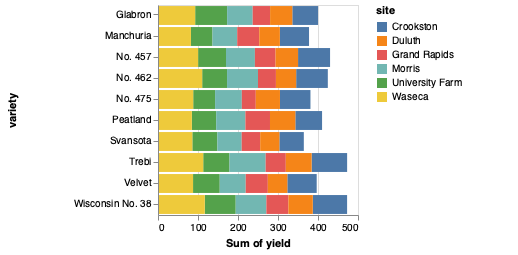

In [37]:
dataset("barley") |>
@vlplot(:bar, x="sum(yield)", y=:variety, color=:site)

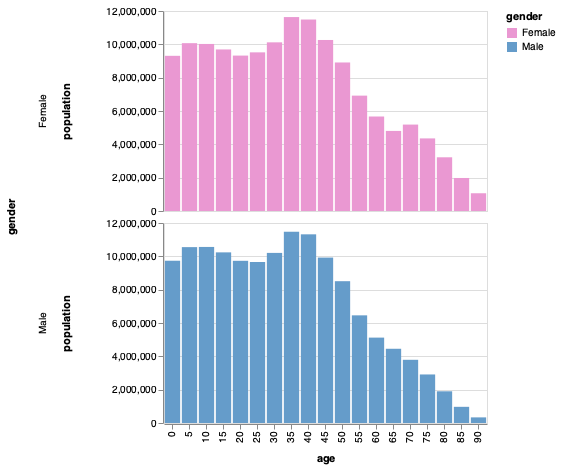

In [38]:
dataset("population") |>
@vlplot(
    :bar,
    transform=[
        {filter="datum.year==2000"},
        {calculate="datum.sex==2 ? 'Female' : 'Male'",as=:gender}
    ],
    row="gender:n",
    y={"sum(people)", axis={title="population"}},
    x={"age:o", scale={rangeStep=17}},
    color={"gender:n", scale={range=["#EA98D2", "#659CCA"]}}
)

In [39]:
using D3Magic

┌ Info: Recompiling stale cache file /Users/raukhur/.julia/compiled/v1.0/D3Magic/gtKTk.ji for D3Magic [c8bb5f1a-6b03-56cb-abf4-1e899fa7e5b0]
└ @ Base loading.jl:1190


In [40]:
using WebIO

In [41]:
node(:div, "Hello, World")

(div
  "Hello, World")

In [42]:
node(:ul,
    node(:li, "get milk"),
    node(:li, "make a pie"), attributes=Dict(:class => "my-list"))

(ul { attributes=Dict(:class=>"my-list") }
  (li
    "get milk")
  (li
    "make a pie"))

In [43]:
node(:div, "Hello, World",
     style=Dict(:backgroundColor => "black",
                :color => "white",
                :padding => "12px"))

(div { style=Dict(:color=>"white",:padding=>"12px",:backgroundColor=>"black") }
  "Hello, World")

In [44]:
using WebIO, JSExpr

w = Scope(imports=["https://d3js.org/d3.v4.min.js"])

node(:H3,"Today is a nice day")



@js d3.select("h3").style("color", "darkblue")


JSString("d3.select(\"h3\").style(\"color\",\"darkblue\")")

In [45]:
@js Math.random()

JSString("Math.random()")

In [46]:
@js alert("Hello, World!")

JSString("alert(\"Hello, World!\")")

In [47]:
js"""
alert("Hello, World!")
"""

JSString("alert(\"Hello, World!\")\n")